Epoch [0/50] Batch 0/7262                   Loss D: 0.6760, loss G: 0.7727


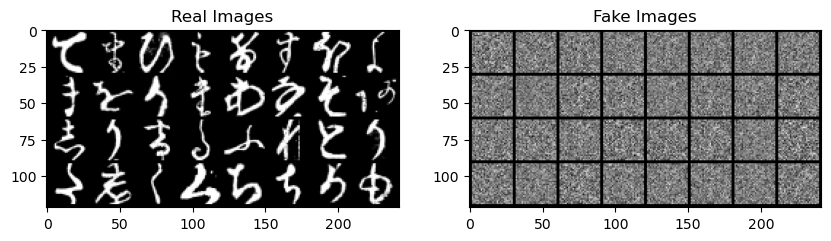

Epoch [1/50] Batch 0/7262                   Loss D: 0.4894, loss G: 2.2974


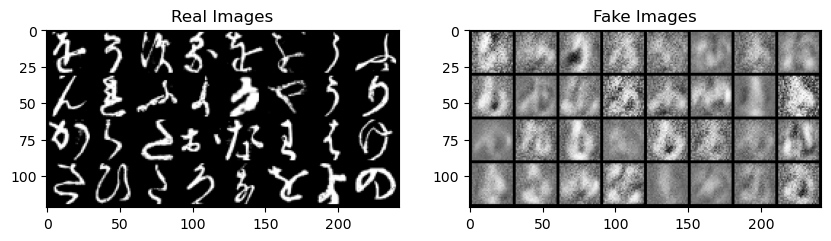

Epoch [2/50] Batch 0/7262                   Loss D: 0.5109, loss G: 2.4344


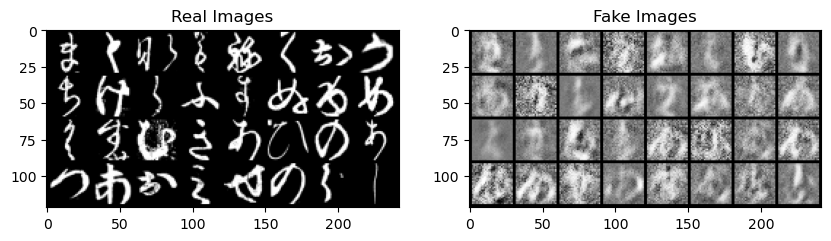

Epoch [3/50] Batch 0/7262                   Loss D: 0.4421, loss G: 1.8861


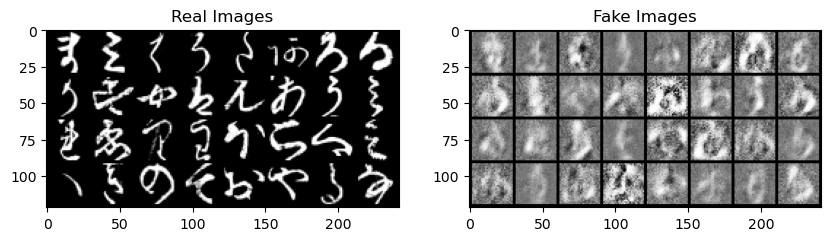

Epoch [4/50] Batch 0/7262                   Loss D: 0.5806, loss G: 1.8338


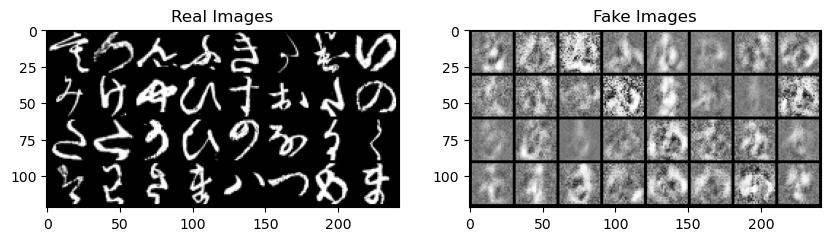

Epoch [5/50] Batch 0/7262                   Loss D: 0.4189, loss G: 1.9748


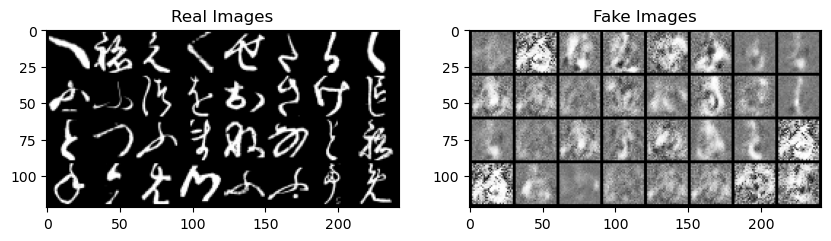

Epoch [6/50] Batch 0/7262                   Loss D: 0.6015, loss G: 1.8163


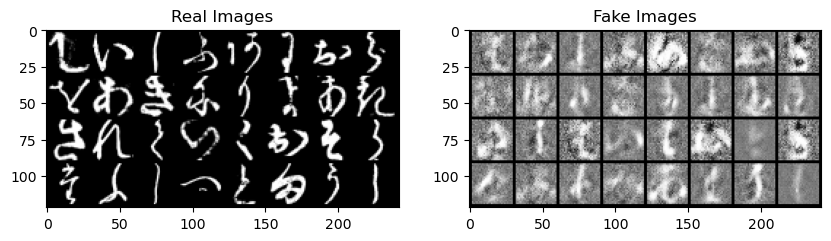

Epoch [7/50] Batch 0/7262                   Loss D: 0.5356, loss G: 2.3140


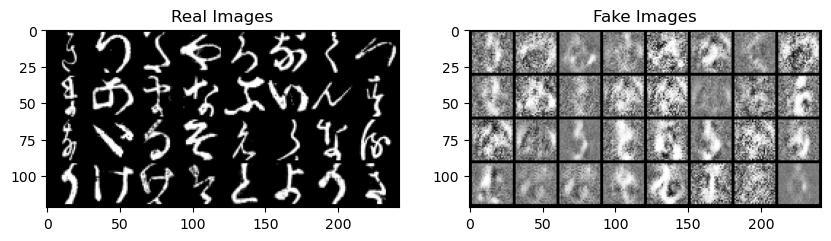

Epoch [8/50] Batch 0/7262                   Loss D: 0.4083, loss G: 2.1380


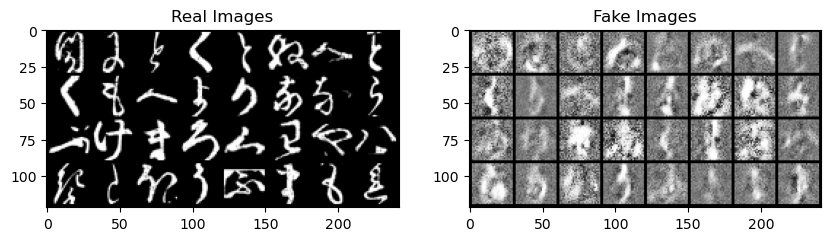

Epoch [9/50] Batch 0/7262                   Loss D: 0.4598, loss G: 1.8090


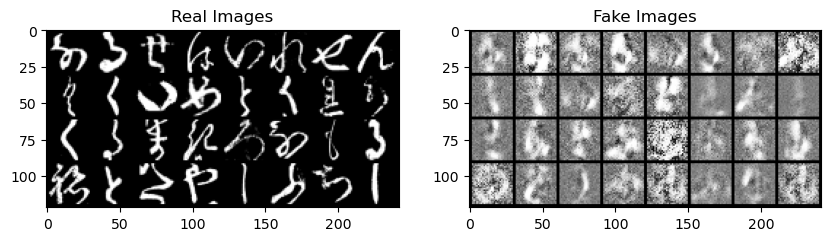

Epoch [10/50] Batch 0/7262                   Loss D: 0.4977, loss G: 1.6777


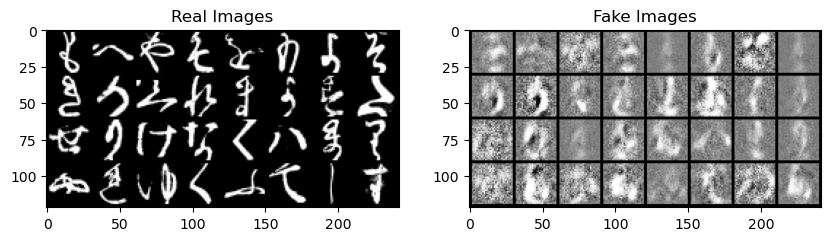

Epoch [11/50] Batch 0/7262                   Loss D: 0.4223, loss G: 2.1694


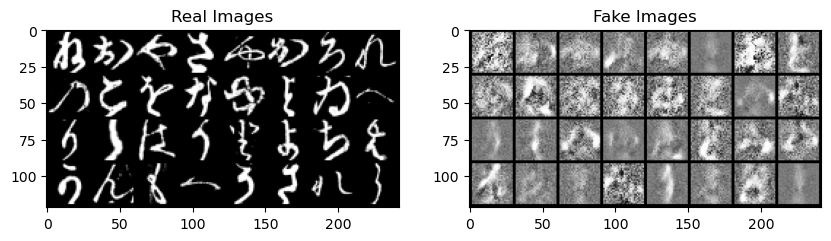

Epoch [12/50] Batch 0/7262                   Loss D: 0.5799, loss G: 2.1435


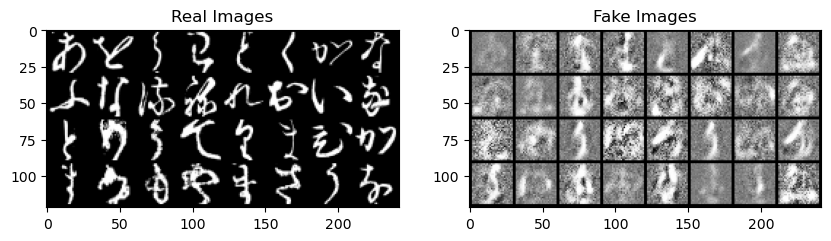

Epoch [13/50] Batch 0/7262                   Loss D: 0.6083, loss G: 1.5841


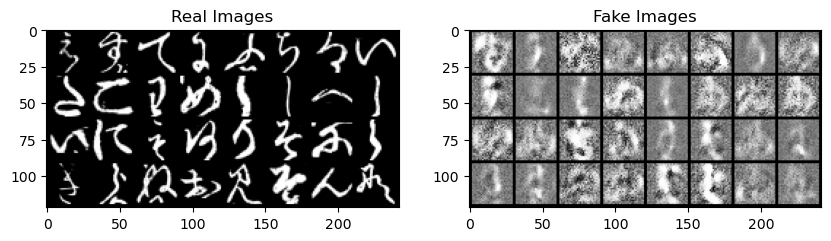

Epoch [14/50] Batch 0/7262                   Loss D: 0.5214, loss G: 2.4619


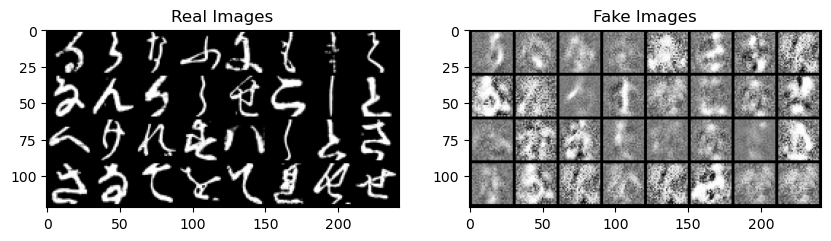

Epoch [15/50] Batch 0/7262                   Loss D: 0.4257, loss G: 2.0229


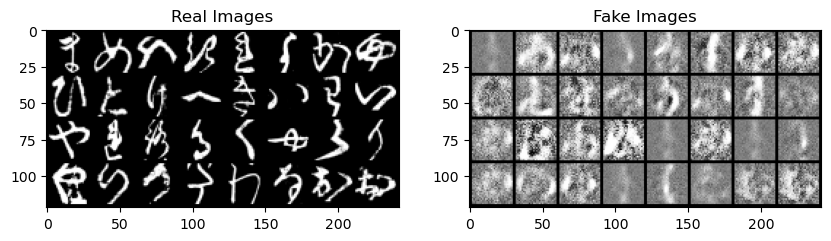

Epoch [16/50] Batch 0/7262                   Loss D: 0.6745, loss G: 1.5843


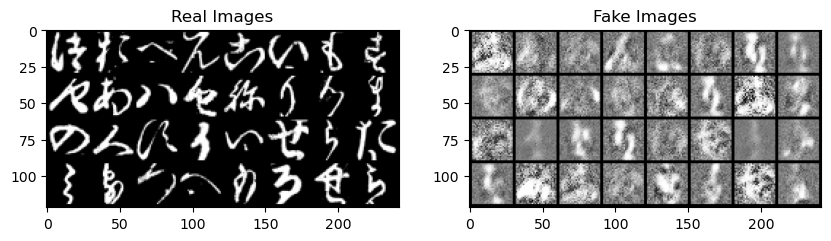

Epoch [17/50] Batch 0/7262                   Loss D: 0.5624, loss G: 1.1327


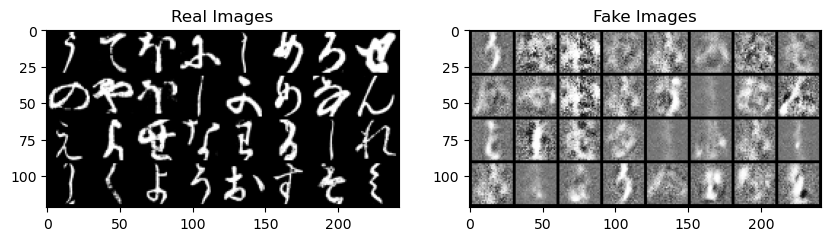

Epoch [18/50] Batch 0/7262                   Loss D: 0.6668, loss G: 1.5199


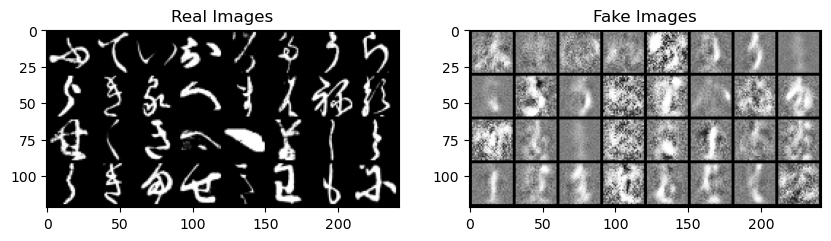

Epoch [19/50] Batch 0/7262                   Loss D: 0.5100, loss G: 1.6378


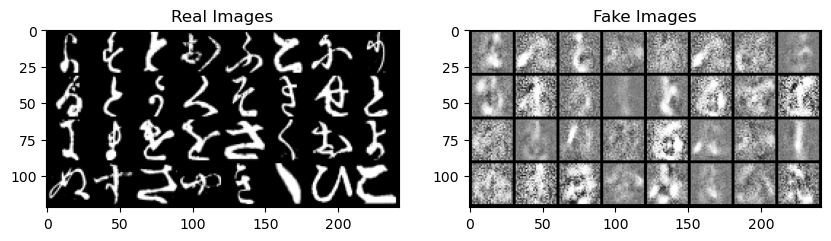

Epoch [20/50] Batch 0/7262                   Loss D: 0.7436, loss G: 1.0104


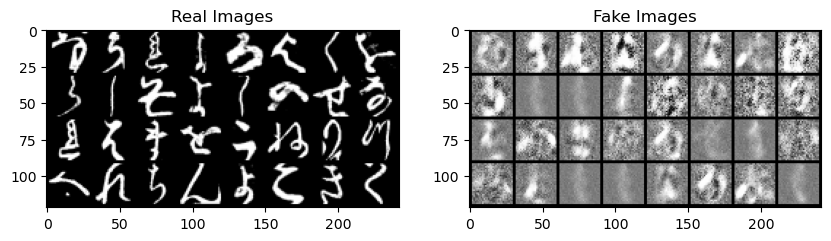

Epoch [21/50] Batch 0/7262                   Loss D: 0.5455, loss G: 1.3930


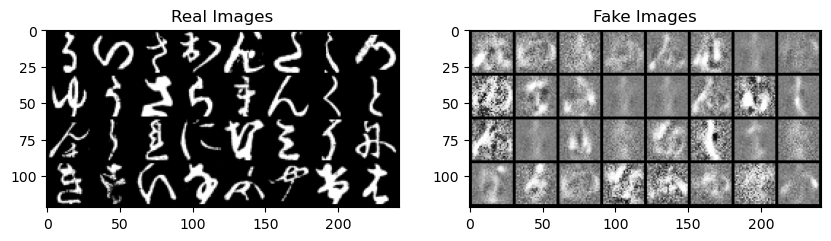

Epoch [22/50] Batch 0/7262                   Loss D: 0.8048, loss G: 2.5694


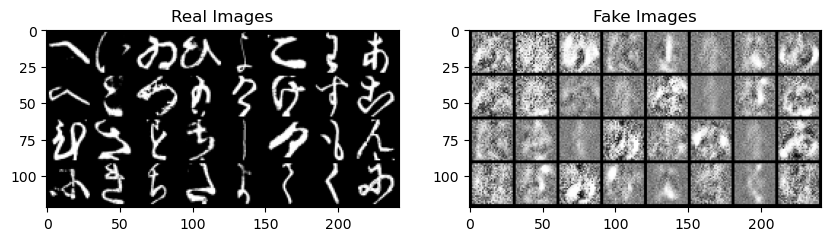

Epoch [23/50] Batch 0/7262                   Loss D: 0.6318, loss G: 1.8054


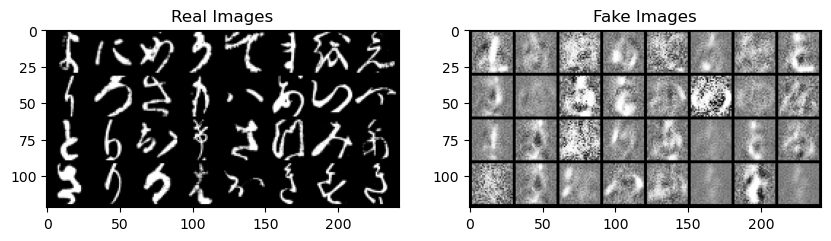

Epoch [24/50] Batch 0/7262                   Loss D: 0.7107, loss G: 1.4545


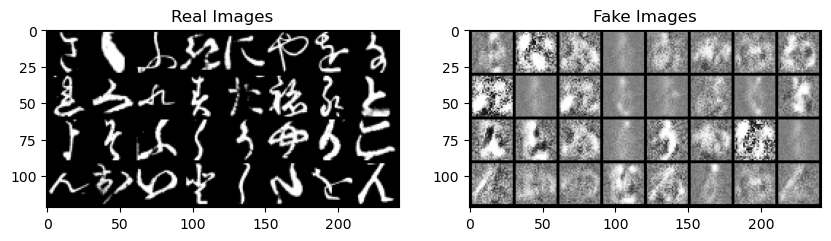

Epoch [25/50] Batch 0/7262                   Loss D: 0.6831, loss G: 1.0903


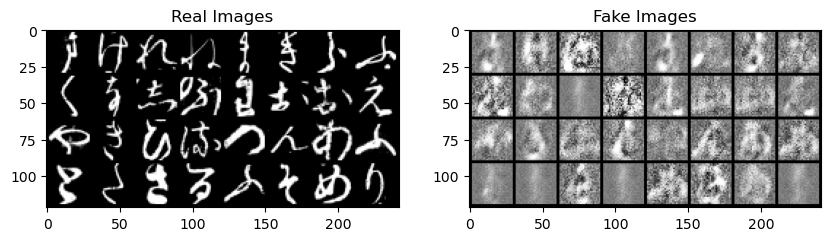

Epoch [26/50] Batch 0/7262                   Loss D: 0.7062, loss G: 0.8150


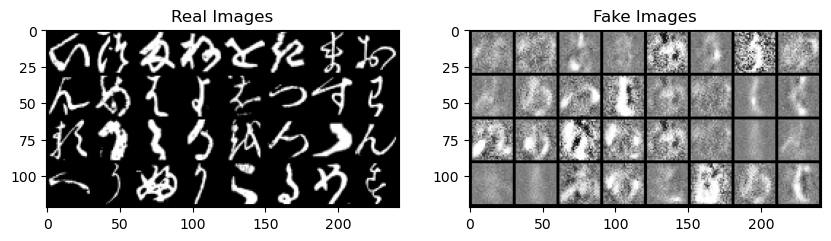

Epoch [27/50] Batch 0/7262                   Loss D: 0.6766, loss G: 2.2276


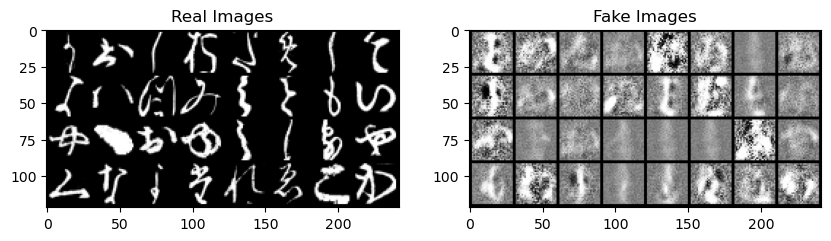

Epoch [28/50] Batch 0/7262                   Loss D: 0.6526, loss G: 1.5194


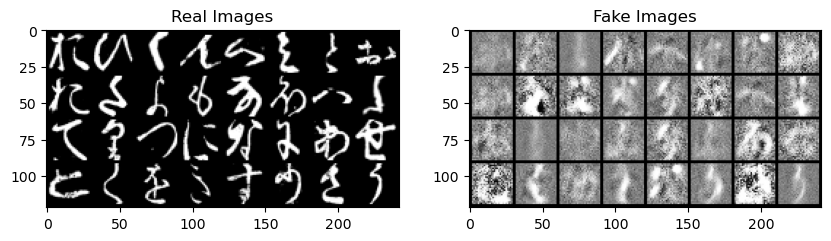

Epoch [29/50] Batch 0/7262                   Loss D: 0.5838, loss G: 1.0333


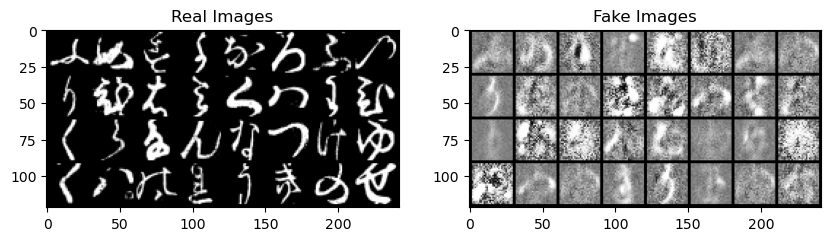

Epoch [30/50] Batch 0/7262                   Loss D: 0.8907, loss G: 1.4602


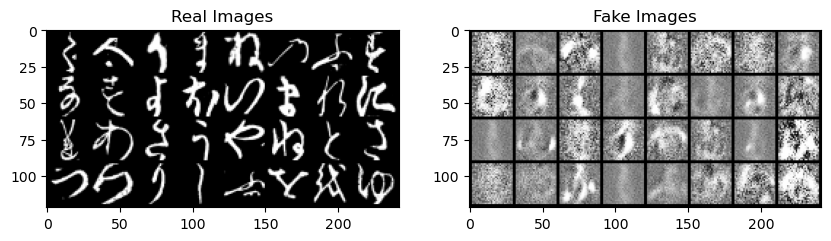

Epoch [31/50] Batch 0/7262                   Loss D: 0.5680, loss G: 1.6545


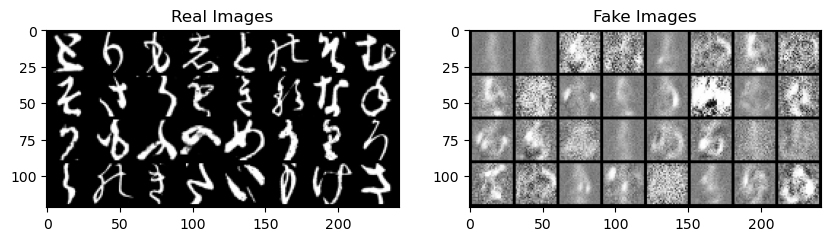

Epoch [32/50] Batch 0/7262                   Loss D: 0.3901, loss G: 1.3912


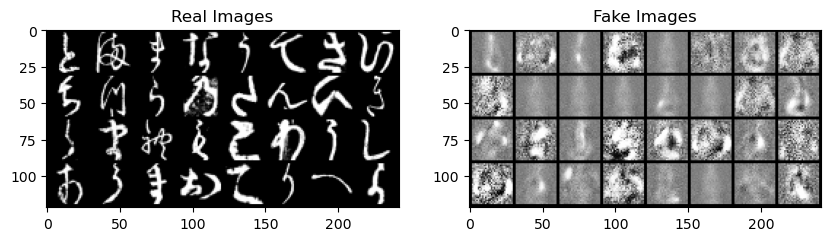

Epoch [33/50] Batch 0/7262                   Loss D: 0.6464, loss G: 1.5849


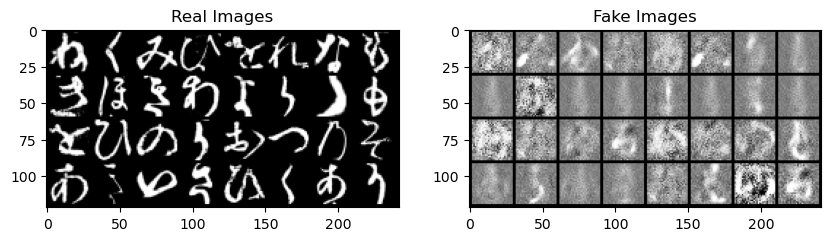

Epoch [34/50] Batch 0/7262                   Loss D: 0.6283, loss G: 2.8498


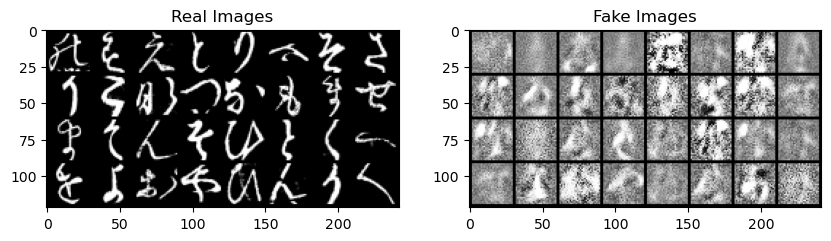

Epoch [35/50] Batch 0/7262                   Loss D: 0.6173, loss G: 1.5390


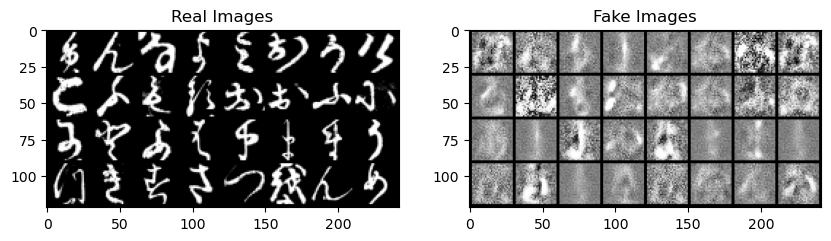

Epoch [36/50] Batch 0/7262                   Loss D: 0.5105, loss G: 1.6366


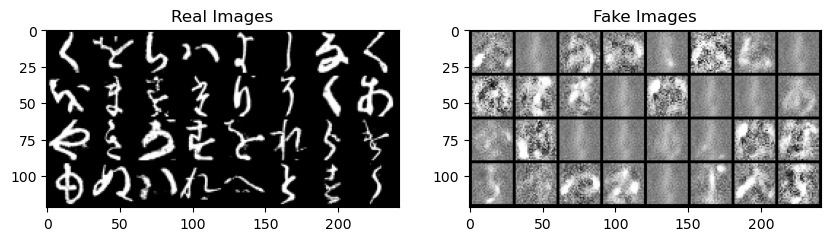

Epoch [37/50] Batch 0/7262                   Loss D: 0.5925, loss G: 1.7094


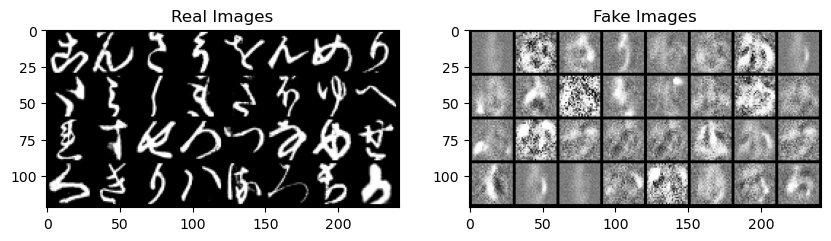

Epoch [38/50] Batch 0/7262                   Loss D: 0.5808, loss G: 1.6105


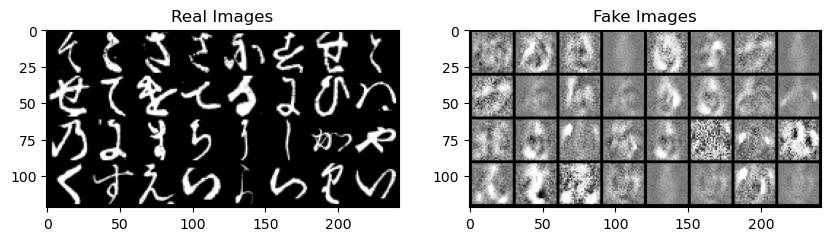

Epoch [39/50] Batch 0/7262                   Loss D: 0.6424, loss G: 1.6467


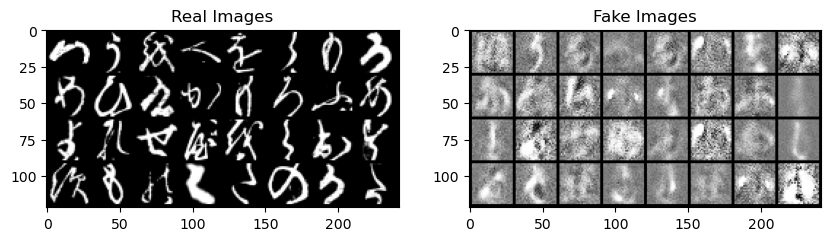

Epoch [40/50] Batch 0/7262                   Loss D: 0.5029, loss G: 1.6219


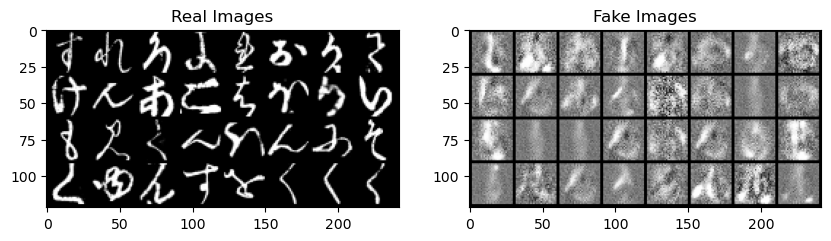

Epoch [41/50] Batch 0/7262                   Loss D: 0.5065, loss G: 1.9166


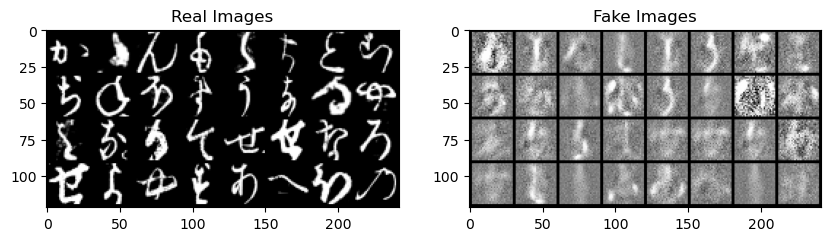

Epoch [42/50] Batch 0/7262                   Loss D: 0.6020, loss G: 0.7442


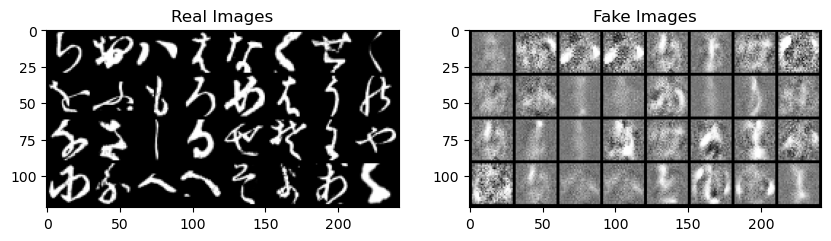

Epoch [43/50] Batch 0/7262                   Loss D: 0.5882, loss G: 1.0884


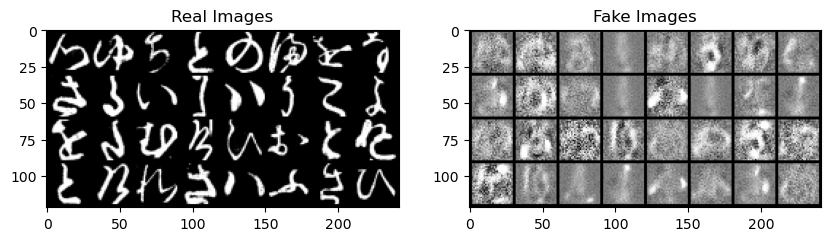

Epoch [44/50] Batch 0/7262                   Loss D: 0.8883, loss G: 1.2091


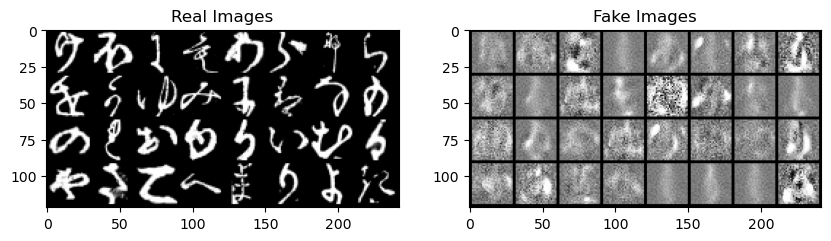

Epoch [45/50] Batch 0/7262                   Loss D: 0.6199, loss G: 1.4689


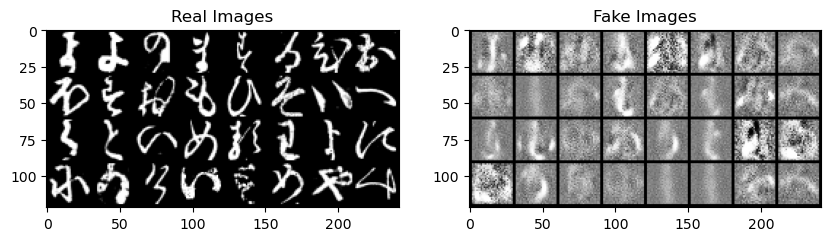

Epoch [46/50] Batch 0/7262                   Loss D: 0.6742, loss G: 0.7956


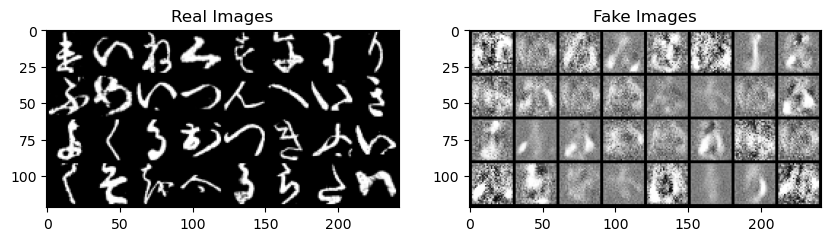

Epoch [47/50] Batch 0/7262                   Loss D: 0.7632, loss G: 1.0217


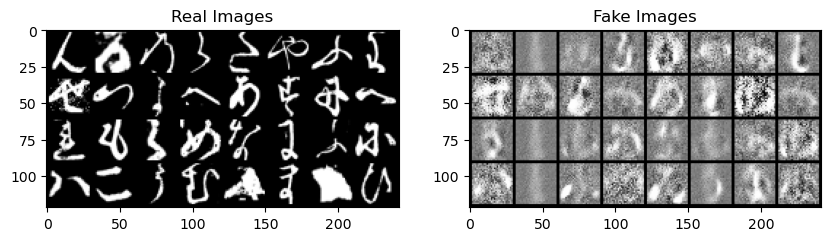

Epoch [48/50] Batch 0/7262                   Loss D: 0.5624, loss G: 0.9293


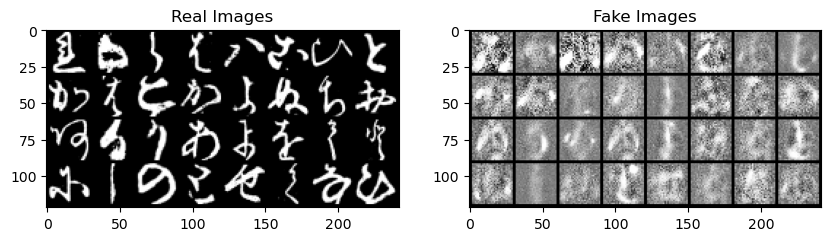

Epoch [49/50] Batch 0/7262                   Loss D: 0.5020, loss G: 1.3648


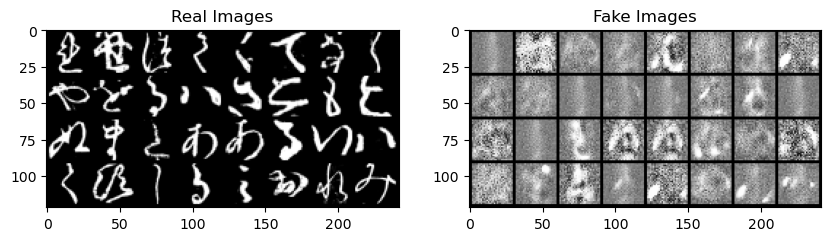

In [2]:
import torch
from torch import nn, optim
from torchvision import transforms
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import os
import numpy as np

# Checking if we have a GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Generator(nn.Module):
    def __init__(self, latent_dim, label_dim, img_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.Linear(latent_dim + label_dim, 256),
            nn.ReLU(),
            nn.Linear(256, img_dim),
            nn.Tanh(),  # Because we normalise images to be between -1 and 1
        )

    def forward(self, x, labels):
        x = torch.cat([x, labels], dim=1)
        return self.gen(x)


class Discriminator(nn.Module):
    def __init__(self, img_dim, label_dim):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(img_dim + label_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x, labels):
        x = torch.cat([x, labels], dim=1)
        return self.disc(x)

# Hyperparameters 
latent_dim = 64
img_x = img_y = 28  # Kuzushiji-49 images are 28x28
img_dim = img_x * img_y
batch_size = 32
lr = 0.001
epochs = 50
num_classes = 49

# Load the Kuzushiji-49 dataset
local_dir = 'C:\\Users\\ASUS\\Documents\\PGM\\Project'
train_images_path = os.path.join(local_dir, 'k49-train-imgs.npz')
train_labels_path = os.path.join(local_dir, 'k49-train-labels.npz')

train_images = np.load(train_images_path)['arr_0']
train_labels = np.load(train_labels_path)['arr_0']

# Normalize and reshape the images
train_images = train_images.astype(np.float32) / 255.0
train_images = train_images.reshape(-1, img_dim)

# Compute the median number of foreground pixels for each class
threshold = 128

def count_foreground_pixels(image, threshold):
    binary_image = image > threshold
    pixels = np.sum(binary_image)
    return pixels

median_pixel_counts = []
class_labels = np.unique(train_labels)

for label in class_labels:
    class_indices = np.where(train_labels == label)
    pixel_counts = [count_foreground_pixels(train_images[i], threshold) for i in class_indices[0]]
    median_pixel_count = np.median(pixel_counts)
    median_pixel_counts.append(median_pixel_count)

style_labels = []

for i in range(len(train_labels)):
    label = train_labels[i]
    pixel_count = count_foreground_pixels(train_images[i], threshold)
    if pixel_count > median_pixel_counts[label]:
        style_labels.append(1)  # Thick
    else:
        style_labels.append(0)  # Thin

style_labels = np.array(style_labels)

# Data Preparation
X_train = torch.tensor(train_images).float().to(device)
y_train = torch.tensor(train_labels).long().to(device)
style_labels = torch.tensor(style_labels).float().view(-1, 1).to(device)

# One-hot encoding for labels
def to_one_hot(labels, num_classes):
    return torch.eye(num_classes)[labels]

y_train_one_hot = to_one_hot(y_train, num_classes).to(device)
train_dataset = TensorDataset(X_train, y_train_one_hot, style_labels)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Generator and Discriminator
generator = Generator(latent_dim, num_classes + 1, img_dim).to(device)
discriminator = Discriminator(img_dim, num_classes + 1).to(device)

# Optimizers
opt_gen = torch.optim.Adam(generator.parameters(), lr=lr)
opt_disc = torch.optim.Adam(discriminator.parameters(), lr=lr)

# Loss function
criterion = nn.BCELoss()

for epoch in range(epochs):
    for batch_idx, (real, labels, styles) in enumerate(train_loader):
        real = real.view(-1, img_dim).to(device)
        batch_size = real.shape[0]

        # Sample noise
        noise = torch.randn(batch_size, latent_dim).to(device)
        conditional_labels = torch.cat([labels, styles], dim=1)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        fake = generator(noise, conditional_labels)

        disc_real = discriminator(real, conditional_labels).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = discriminator(fake.detach(), conditional_labels).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        discriminator.zero_grad()
        lossD.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z)))
        output = discriminator(fake, conditional_labels).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        generator.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{epochs}] Batch {batch_idx}/{len(train_loader)} \
                  Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            with torch.no_grad():
                fake = generator(noise, conditional_labels).reshape(-1, 1, img_x, img_y)
                data = real.reshape(-1, 1, img_x, img_y)
                img_grid_fake = make_grid(fake, normalize=True)
                img_grid_real = make_grid(data, normalize=True)

                plt.figure(figsize=(10,10))
                plt.subplot(1,2,1)
                plt.title("Real Images")
                plt.imshow(img_grid_real.permute(1, 2, 0).cpu().numpy())
                plt.subplot(1,2,2)
                plt.title("Fake Images")
                plt.imshow(img_grid_fake.permute(1, 2, 0).cpu().numpy())
                plt.show()


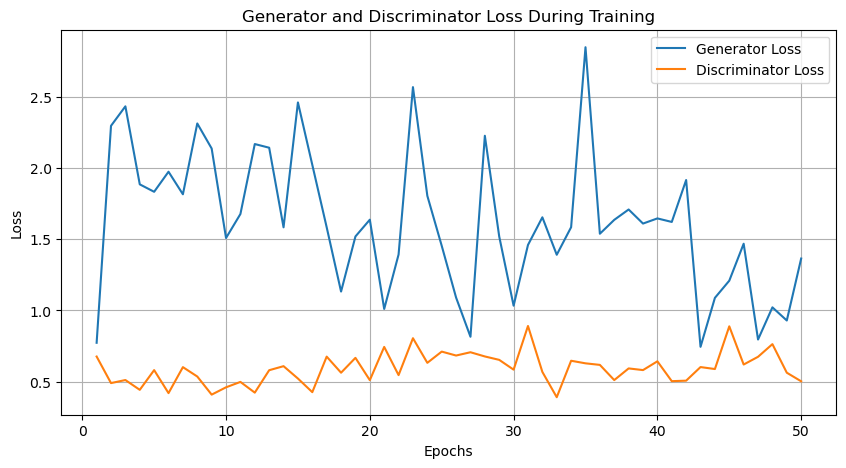

In [2]:
import matplotlib.pyplot as plt
lossg = [0.7727, 2.2974, 2.4344, 1.8861, 1.8338, 1.9748, 1.8163, 2.3140, 2.1380, 1.5090, 1.6777, 2.1694, 2.1435, 1.5841, 2.4619, 2.0229, 1.5843, 1.1327, 1.5199, 1.6378, 1.0104, 1.3930, 2.5694, 1.8054, 1.4545, 1.0903, 0.8150, 2.2276, 1.5194, 1.0333, 1.4602, 1.6545, 1.3912, 1.5849, 2.8498, 1.5390, 1.6366, 1.7094, 1.6105, 1.6467, 1.6219, 1.9166, 0.7442, 1.0884, 1.2091, 1.4689, 0.7956, 1.0217, 0.9293, 1.3648]
lossd = [0.6760, 0.4894, 0.5109, 0.4420, 0.5806, 0.4189, 0.6015, 0.5356, 0.4083, 0.4598, 0.4977, 0.4223, 0.5799, 0.6083, 0.5214, 0.4257, 0.6754, 0.5624, 0.6668, 0.5100, 0.7436, 0.5455, 0.8048, 0.6318, 0.7107, 0.6831, 0.7062, 0.6766, 0.6526, 0.5838, 0.8907, 0.5680, 0.3901, 0.6464, 0.6283, 0.6173, 0.5105, 0.5925, 0.5808, 0.6424, 0.5029, 0.5065, 0.6020, 0.5882, 0.8883, 0.6199, 0.6742, 0.7632, 0.5624, 0.5020]
epoch = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50]
plt.figure(figsize=(10, 5))
plt.plot(epoch, lossg, label='Generator Loss')
plt.plot(epoch, lossd, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Loss During Training')
plt.legend()
plt.grid(True)
plt.show()